### Analysis of OpenTable data
- Data Source: https://www.opentable.com/state-of-industry
- State Restaurant Openings: https://www.eater.com/21264229/where-restaurants-reopened-across-the-u-s

In [62]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns

from state_config import state_conversion, regions

sns.set()
rcParams['font.family'] = 'DejaVu Sans'
pd.options.display.max_columns = 500
pd.options.display.max_rows = 50

In [63]:
state_calendar = pd.read_csv('../data/restaurant_opens.csv')
data = pd.read_csv('../data/opentable.csv')

# Rename date columns
for date in data.columns[2:]:
    data.rename(columns={date: date + '/20'}, inplace=True)

# Date columns: April 20 and onward
dates = data.columns[64:]

print(data.shape)
data.head()

(105, 143)


,Type,Name,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,3/2/20,3/3/20,3/4/20,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20,3/15/20,3/16/20,3/17/20,3/18/20,3/19/20,3/20/20,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20,5/7/20,5/8/20,5/9/20,5/10/20,5/11/20,5/12/20,5/13/20,5/14/20,5/15/20,5/16/20,5/17/20,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20,5/28/20,5/29/20,5/30/20,5/31/20,6/1/20,6/2/20,6/3/20,6/4/20,6/5/20,6/6/20,6/7/20,6/8/20,6/9/20,6/10/20,6/11/20,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20
0,country,Global,-1,3,-1,-2,1,4,1,1,-2,-3,-1,1,0,-8,-9,-6,-7,-7,-4,-3,-14,-18,-19,-28,-36,-40,-47,-56,-83,-89,-96.03,-97.94,-98.96,-99.24,-99.68,-99.72,-99.75,-99.79,-99.83,-99.85,-99.89,-99.83,-99.87,-99.91,-99.92,-99.92,-99.94,-99.94,-99.93,-99.94,-99.94,-100,-99.94,-99.95,-99.95,-99.94,-99.94,-99.93,-99.93,-99.93,-99.93,-99.94,-99.95,-99.93,-99.92,-99.94,-99.94,-99.92,-99.94,-99.85,-99.86,-99.84,-99.79,-99.00,-99.12,-99.26,-98.38,-98.26,-98.37,-98.16,-97.62,-97.57,-97.22,-96.25,-96.26,-95.92,-95.53,-93.99,-93.34,-93.90,-93.53,-92.39,-91.30,-89.17,-87.85,-87.75,-88.32,-88.26,-86.20,-85.02,-85.38,-82.67,-81.72,-82.68,-81.74,-83.29,-81.13,-80.21,-76.12,-74.62,-74.88,-76.39,-76.02,-73.09,-70.80,-66.51,-66.54,-78.84,-69.80,-68.10,-67.18,-66.30,-61.65,-60.36,-45.42,-67.31,-66.63,-64.96,-63.03,-58.55,-57.77,-61.02,-66.17,-62.74,-62.96,-55.06,-58.60,-72.70,-57.12,-61.70,-62.15
1,country,Australia,-3,-6,-3,-1,0,0,0,-2,-2,-7,0,-1,4,-12,-6,-12,-8,-6,-3,-4,-10,-4,-10,-12,-8,-11,-12,-30,-43,-50,-53.00,-51.67,-53.61,-65.53,-99.82,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-98.51,-99.03,-98.57,-99.03,-97.01,-94.61,-94.71,-92.67,-92.86,-92.64,-91.21,-90.45,-91.19,-90.08,-96.13,-87.49,-76.07,-84.39,-88.53,-88.12,-86.44,-45.00,-46.23,-39.88,-37.86,-33.66,-36.17,-39.91,-40.35,-34.78,-30.08,-19.75,-17.30,-20.12,-16.99,-24.70,-16.24,-15.31,-9.31,-5.75,-7.97,-2.80,-16.21,-17.85,-6.37,-0.93,44.66,3.65,-1.02,-10.52,-75.10,6.95,-71.81,-69.29,-77.17,-22.81,-28.50,58.45
2,country,Canada,-5,0,-3,-2,-1,8,-2,-3,1,-12,-8,-4,-7,-12,-7,-2,-4,-8,-9,-1,-13,-18,-19,-28,-40,-41,-47,-60,-94,-97,-99.47,-99.72,-99.89,-99.94,-99.97,-99.99,-99.97,-99.98,-99.98,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-99.99,-99.99,-100.00,-100.00,-100.00,-100.00,-100.00,-99.99,-99.99,-100.00,-100.00,-100.00,-100.00,-100.00,-99.99,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-100.00,-99.99,-100.00,-99.93,-99.94,-99.89,-99.20,-98.92,-98.56,-98.56,-98.13,-94.83,-94.39,-94.49,-94.57,-93.98,-92.87,-98.63,-88.86,-87.85,-89.14,-88.47,-89.51,-88.22,-83.14,-85.33,-84.39,-84.95,-83.61,-82.93,-81.22,-83.82,-82.87,-80.59,-80.16,-77.78,-77.43,-84.76,-79.10,-75.12,-74.23,-73.43,-69.73,-68.87,-55.00,-66.29,-70.59,-68.28,-65.73,-57.62,-57.00,-62.66,-68.60,-43.72,-43.84,-63.30,-57.80,-87.14,-53.43,-58.48,-59.52
3,country,Germany,11,4,3,5,1,2,11,4,5,5,11,7,9,-8,0,-4,-6,-7,4,11,-10,-16,-11,-17,-28,-38,-46,-63,-90,-95,-98.36,-98.79,-99.78,-99.96,-100.00,-100.00,-100.00,-100.00,-

### Regional Breakdown

In [64]:
# Reorder dictionary for mapping
new_regions = {}
for key, values in regions.items():
    for value in values:
        new_regions[value] = key
        
new_states = {}
for key, value in state_conversion.items():
    new_states[value] = key

data['state_abbreviation'] = data['Name'].map(new_states)
data['region'] = data['state_abbreviation'].map(new_regions)

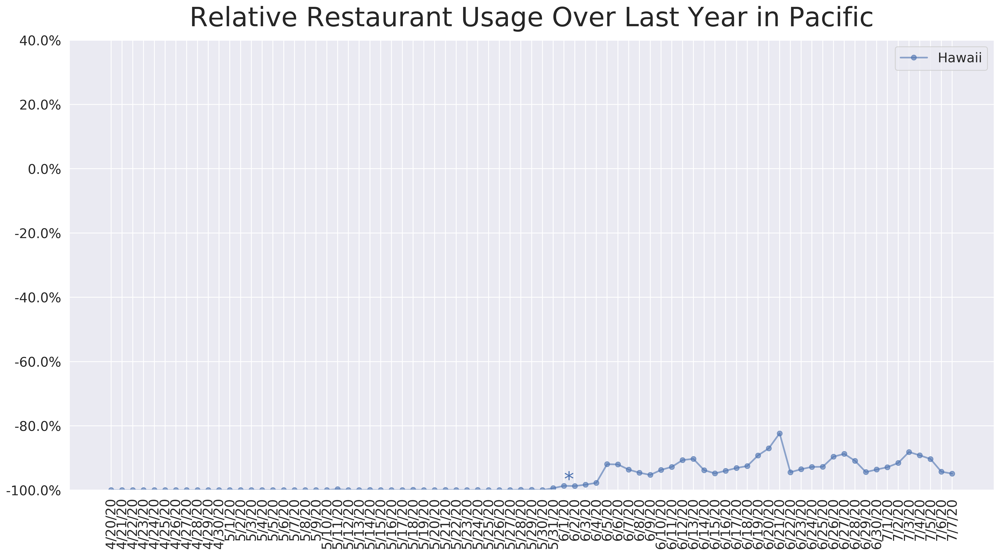

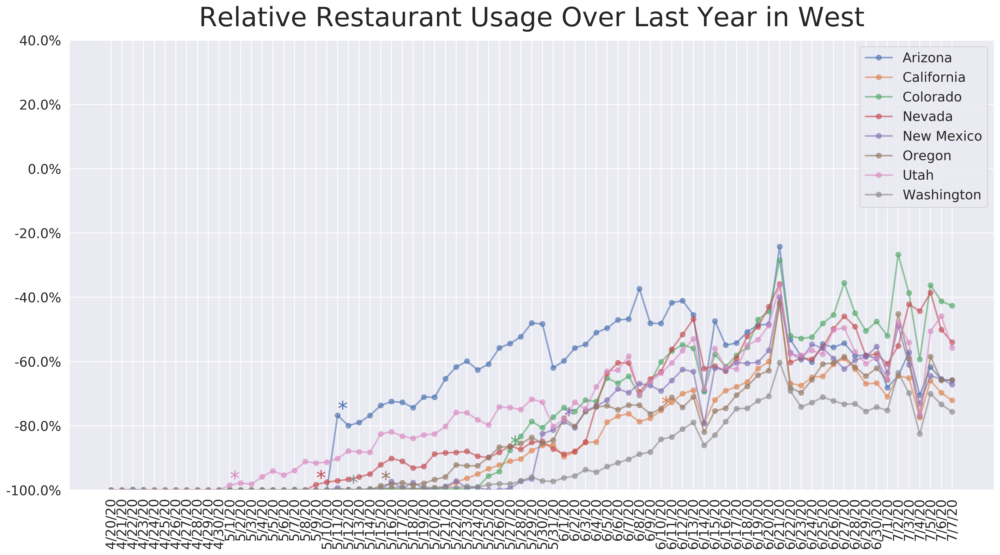

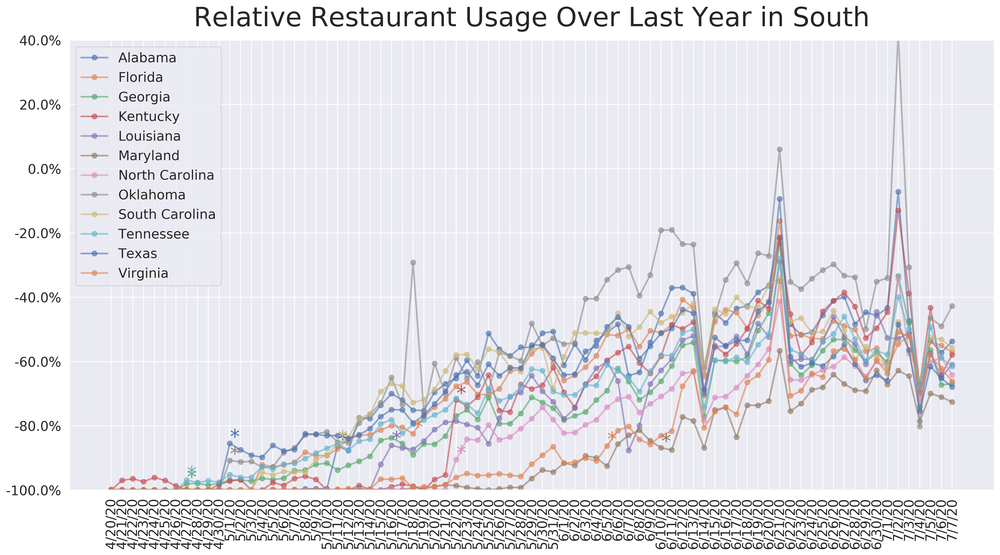

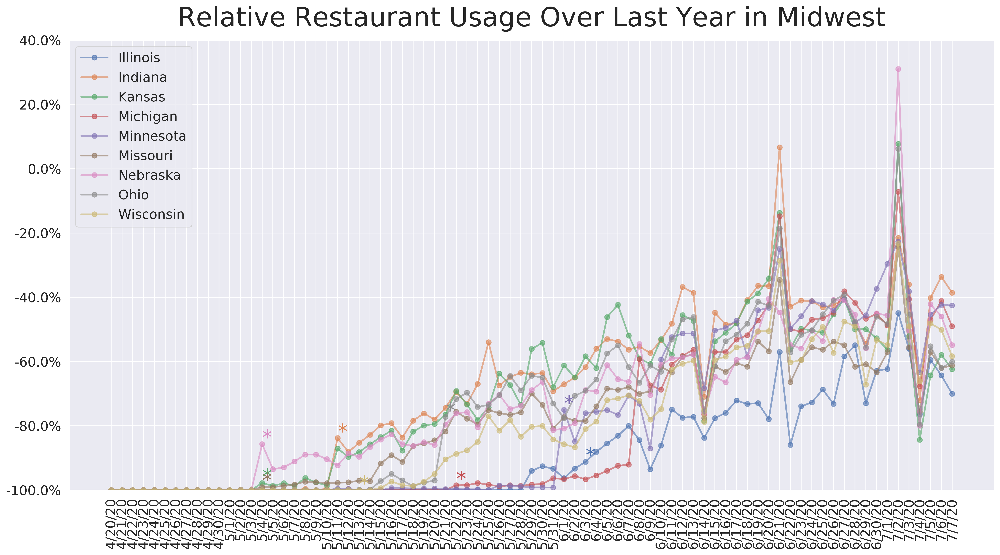

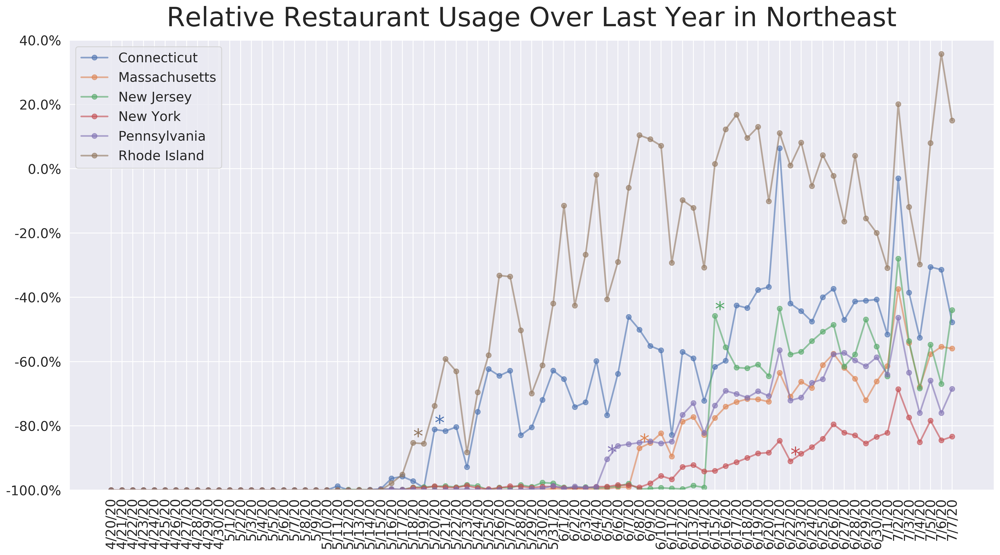

In [85]:
def plot_combined(df, region, dates):
    
    plt.figure(figsize=(20, 10), dpi=400)
    
    region_df = df[(df['region'] == region) & (df['Type'] == 'state')]
    
    for index, row in region_df.iterrows():
        
        # Isolate Pertinent Data
        state = row['Name']
        index_values = row[dates]
        
        # Plot
        line_plot = plt.plot(dates, index_values, label=state, alpha=0.6, linewidth=2.0, marker='o')
        line_color = line_plot[0].get_color()
        
        # Annotation
        open_date = state_calendar.loc[state_calendar['State'] == state, 'Date'].values[0]
        date_index_value = row[open_date]
        plt.text(open_date, date_index_value, "*", color=line_color, fontsize=24)
        plt.ylim(-105, -10)

    # Formatting
    plt.ylim(-100, 40)
    plt.xticks(fontsize=16, rotation=90)
    plt.gca().set_yticklabels(['{}%'.format(x) for x in plt.gca().get_yticks()])
    plt.yticks(fontsize=16)
    plt.title(f'Relative Restaurant Usage Over Last Year in {region}', fontsize=32, y=1.02)
    plt.legend(fontsize=16)
    plt.show()


plot_combined(data, 'Pacific', dates)
plot_combined(data, 'West', dates)
plot_combined(data, 'South', dates)
plot_combined(data, 'Midwest', dates)
plot_combined(data, 'Northeast', dates)